## Load dataset

In [2]:
import pandas as pd
import numpy as np
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
#from imblearn.over_sampling import SMOTE 
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, recall_score, confusion_matrix
from sklearn.metrics import f1_score

In [4]:
#load the file
df = pd.read_excel('UT Comp_Seq.xlsx')
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import math
from sklearn.metrics import mean_squared_error
from statsmodels.graphics.gofplots import qqplot
from sklearn.linear_model import LinearRegression 
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split

from scipy.stats import shapiro
from scipy.stats import normaltest
from scipy import stats


# Last update/meeting

scatter plot between frac design and response variables

frac design = total prop/fluids * 42

remove parameters that are a function of one another
want to avoid multicollinearity 

want final list of predicatble variables
-->only categorical is compl type (remove township, can keep formation if you want)


among continuous variables, do a pairs plot to ensure that there is no multicollinearity

imputing 

1 vs 3, 1 vs 6, 1 vs 9, 1 vs 12, 1 vs cum

calculate standard deviations of each month -->calculate pairwise correlation:
s1, s3, s6...
r13, r1
m

## Clean Data
### 1. Remove Duplicate

In [5]:
dpl = sum(df.duplicated())
print("There is ",  dpl,  " duplicate") # no duplicate

There is  0  duplicate


### 2. Replace Na Values

#### Correlation 

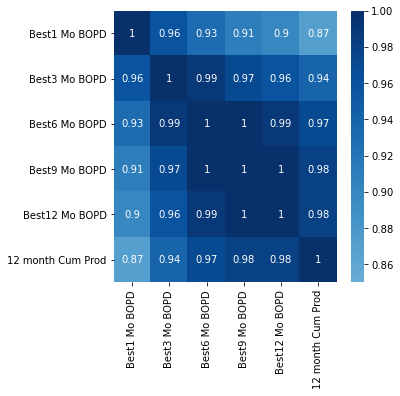

In [6]:
na_column = ['Best1 Mo BOPD', 'Best3 Mo BOPD', 'Best6 Mo BOPD',
       'Best9 Mo BOPD', 'Best12 Mo BOPD', '12 month Cum Prod']
corr_matrix = df[na_column].corr().round(2)
plt.figure(figsize=(5, 5))
sns.heatmap(corr_matrix, annot=True, vmax=1, vmin=0.85, center=.85, cmap='Blues')
plt.show()

# Finding controllable features

In [80]:
df.head()

,Operator,Well Name,Formation,Lateral Length,Stages,Township,Range,Section,"Total Prop, lbs","Fluid, bbls",...,SPACING_CAPPED,12 month Cum Prod,pred_p12,pred_p9,pred_p6,pred_p3,pred_p1,ComplType_counts,ComplType_new,stage_length
34,Operator 12,Well 3980,TFH,8851.0,44.0,150,94,20,8889960.0,106544.000000,...,660.000000,231.83,602.486653,657.759656,789.506478,984.681442,1226.896464,1503.0,P & P (cmt.),201.159091
35,Operator 12,Well 3984,TFH,9572.0,47.0,150,94,20,9577580.0,114748.000000,...,401.702850,227.93,592.769802,615.242634,701.155046,851.472466,1096.391872,1503.0,P & P (cmt.),203.659574
36,Operator 12,Well 3993,TFH,9041.0,45.0,150,94,17,9046920.0,106883.000000,...,660.000000,247.08,640.417789,719.976635,859.567590,1084.581088,1328.483576,1503.0,P & P (cmt.),200.911111
45,Operator 32,Well 4556,TFH,10590.0,30.0,152,96,3,3499020.0,55731.166667,...,584.488175,217.32,566.299567,654.442821,791.635123,1009.711318,1360.068369,4244.0,Sleeves,353.000000
47,Operator 32,Well 4570,MBH,10594.0,30.0,152,96,3,3318860.0,53292.714286,...,571.085825,227.87,592.620258,708.809832,847.615438,1081.208706,1414.542879,4244.0,Sleeves,353.133333


In [81]:
df.columns

Index(['Operator', 'Well Name', 'Formation', 'Lateral Length', 'Stages',
       'Township ', 'Range', 'Section', 'Total Prop, lbs', 'Fluid, bbls',
       'Date Fracd', 'Best1 Mo BOPD', 'Best3 Mo BOPD', 'Best6 Mo BOPD',
       'Best9 Mo BOPD', 'Best12 Mo BOPD', 'Compl. Type', 'Latitude',
       'Longitude', 'Fluid Type from DI', 'SPACING_CAPPED',
       '12 month Cum Prod', 'pred_p12', 'pred_p9', 'pred_p6', 'pred_p3',
       'pred_p1', 'ComplType_counts', 'ComplType_new', 'stage_length'],
      dtype='object')

In [83]:
# Controllable features are:

#'Formation', 'Lateral Length', 'Stages',
 #      'Total Prop, lbs', 'Fluid, bbls',
  #     'Date Fracd', 'Compl. Type',  'SPACING_CAPPED',
   #     'stage_length'

# Create 'frac design' parameter

In [84]:
## Creating new variable "Stage Length" = LL/Stages

df['frac_design'] = df['Total Prop, lbs']/(df['Fluid, bbls']*42)

#### Association between variablee

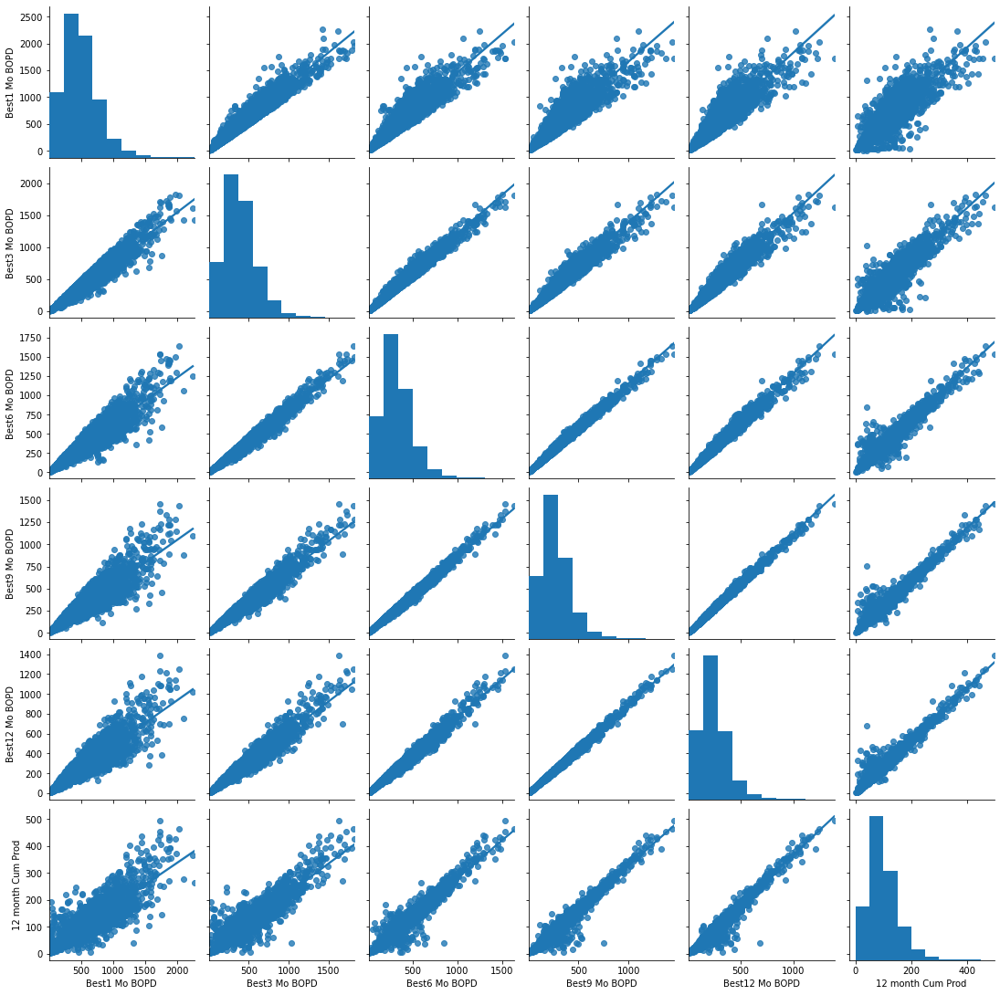

In [7]:
sns.pairplot(df[na_column], kind="reg")
plt.show()

#### Association between natural logarithmic variablee

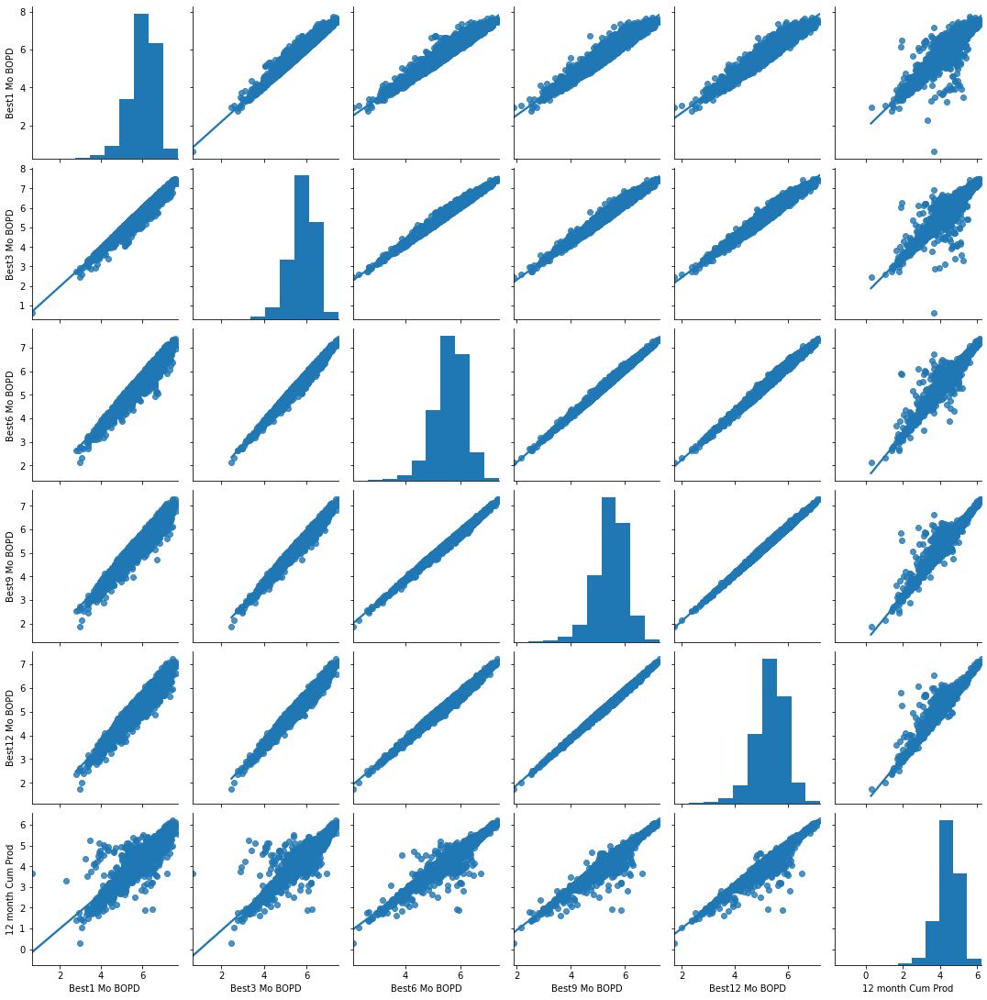

In [8]:
df_log = np.log(df[na_column])
sns.pairplot(df_log, kind="reg")
plt.show()

Because of non equal variance we use Natural Log 

#### Linear models for predicting Na values base on highest correlated varible

In [9]:
dflog_p01 = df_log[["Best1 Mo BOPD", "Best3 Mo BOPD"]].dropna()
model01 = LinearRegression().fit(dflog_p01["Best3 Mo BOPD"].values.reshape(-1,1),
                                dflog_p01["Best1 Mo BOPD"].values.reshape(-1,1))

In [10]:
dflog_p03 = df_log[["Best3 Mo BOPD", "Best6 Mo BOPD"]].dropna()
model03 = LinearRegression().fit(dflog_p03["Best6 Mo BOPD"].values.reshape(-1,1),
                                dflog_p03["Best3 Mo BOPD"].values.reshape(-1,1))

In [11]:
dflog_p06 = df_log[["Best6 Mo BOPD", "Best9 Mo BOPD"]].dropna()
model06 = LinearRegression().fit(dflog_p06["Best9 Mo BOPD"].values.reshape(-1,1),
                                dflog_p06["Best6 Mo BOPD"].values.reshape(-1,1))

In [12]:
dflog_p09 = df_log[["Best9 Mo BOPD", "Best12 Mo BOPD"]].dropna()
model09 = LinearRegression().fit(dflog_p09["Best12 Mo BOPD"].values.reshape(-1,1),
                                dflog_p09["Best9 Mo BOPD"].values.reshape(-1,1))

In [13]:
dflog_p12 = df_log[["Best12 Mo BOPD", "12 month Cum Prod"]].dropna()
model12 = LinearRegression().fit(dflog_p12["12 month Cum Prod"].values.reshape(-1,1),
                                dflog_p12["Best12 Mo BOPD"].values.reshape(-1,1))

# Apply each model to predecit the na valuse in each specific coloumn

In [14]:
df[na_column].isnull().sum()

Best1 Mo BOPD        1550
Best3 Mo BOPD        1656
Best6 Mo BOPD        2043
Best9 Mo BOPD        2464
Best12 Mo BOPD       2973
12 month Cum Prod       0
dtype: int64

In [15]:
# Replace 'Best12 Mo BOPD' na values
df["pred_p12"] = np.exp(model12.predict(np.log(df["12 month Cum Prod"].values.reshape(-1,1))))
df["Best12 Mo BOPD"] = np.where(df["Best12 Mo BOPD"].isnull(),
                                df["pred_p12"],
                                df["Best12 Mo BOPD"])

In [16]:
# Replace "Best09 Mo BOPD" na values
df["pred_p9"] = np.exp(model09.predict(np.log(df["Best12 Mo BOPD"].values.reshape(-1,1))))
df["Best9 Mo BOPD"] = np.where(df["Best9 Mo BOPD"].isnull(),
                                df["pred_p9"],
                                df["Best9 Mo BOPD"])

In [17]:
# Replace "Best06 Mo BOPD" na values
df["pred_p6"] = np.exp(model06.predict(np.log(df["Best9 Mo BOPD"].values.reshape(-1,1))))
df["Best6 Mo BOPD"] = np.where(df["Best6 Mo BOPD"].isnull(),
                                df["pred_p6"],
                                df["Best6 Mo BOPD"])

In [18]:
# Replace "Best03 Mo BOPD" na values
df["pred_p3"] = np.exp(model03.predict(np.log(df["Best6 Mo BOPD"].values.reshape(-1,1))))
df["Best3 Mo BOPD"] = np.where(df["Best3 Mo BOPD"].isnull(),
                                df["pred_p3"],
                                df["Best3 Mo BOPD"])

In [19]:
# Replace "Best01 Mo BOPD" na values
df["pred_p1"] = np.exp(model01.predict(np.log(df["Best3 Mo BOPD"].values.reshape(-1,1))))
df["Best1 Mo BOPD"] = np.where(df["Best1 Mo BOPD"].isnull(),
                                df["pred_p1"],
                                df["Best1 Mo BOPD"])

In [20]:
df[na_column].isnull().sum()

Best1 Mo BOPD        0
Best3 Mo BOPD        0
Best6 Mo BOPD        0
Best9 Mo BOPD        0
Best12 Mo BOPD       0
12 month Cum Prod    0
dtype: int64

### Check Normality of "12 month Cum Prod"

#### Histogram Plot

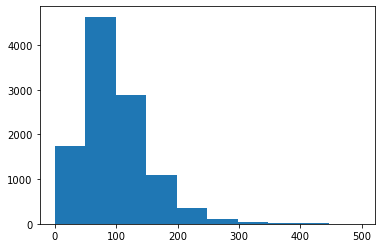

In [21]:
# histogram plot
plt.hist(df["12 month Cum Prod"])
plt.show()

#### qq-plot

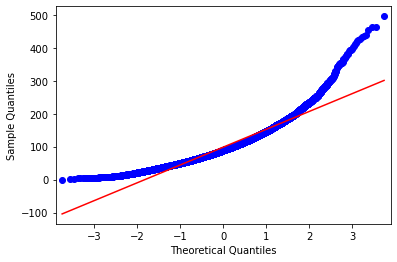

In [22]:
# QQ Plot
qqplot(df["12 month Cum Prod"], line='s')
plt.show()

#### Shapiro-Wilk Test

In [23]:
# Shapiro-Wilk Test
# normality test
stat, p = shapiro(df["12 month Cum Prod"])
print(p)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
	print('Sample looks Gaussian (fail to reject H0)')
else:
	print('Sample does not look Gaussian (reject H0)')

0.0
Statistics=0.915, p=0.000
Sample does not look Gaussian (reject H0)


C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1681: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


#### D’Agostino’s K^2 Test

In [24]:
# D'Agostino and Pearson's Test


stat, p = normaltest(df["12 month Cum Prod"])
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
	print('Sample looks Gaussian (fail to reject H0)')
else:
	print('Sample does not look Gaussian (reject H0)')

Statistics=3143.467, p=0.000
Sample does not look Gaussian (reject H0)


## Check normality for logistic transformation  

In [25]:
# Shapiro-Wilk Test
# normality test
stat, p = shapiro(np.log(df["12 month Cum Prod"]))
print(p)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
	print('Sample looks Gaussian (fail to reject H0)')
else:
	print('Sample does not look Gaussian (reject H0)')

5.605193857299268e-45
Statistics=0.965, p=0.000
Sample does not look Gaussian (reject H0)


In [26]:
# D'Agostino and Pearson's Test
from scipy.stats import normaltest

stat, p = normaltest(np.log(df["12 month Cum Prod"]))
print(p)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
	print('Sample looks Gaussian (fail to reject H0)')
else:
	print('Sample does not look Gaussian (reject H0)')

0.0
Statistics=1739.089, p=0.000
Sample does not look Gaussian (reject H0)


## Completion type bar plot

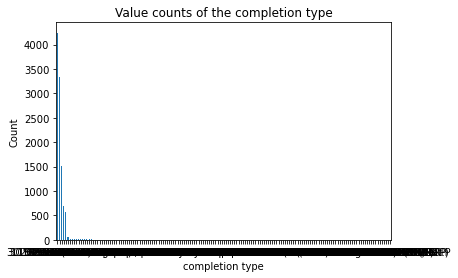

In [27]:
df["Compl. Type"].value_counts().plot(kind="bar")
plt.title("Value counts of the completion type")
plt.xlabel("completion type")
plt.xticks(rotation=0)
plt.ylabel("Count")
plt.show()

In [28]:
# add the count of complType to dataframe
df['ComplType_counts'] = df.groupby(['Compl. Type'])['12 month Cum Prod'].transform('count')

In [29]:
ComplType_unique = df["ComplType_counts"].unique()
print(sorted(ComplType_unique,
            reverse = True))

[4244.0, 3340.0, 1503.0, 687.0, 565.0, nan, 52.0, 26.0, 22.0, 20.0, 18.0, 16.0, 13.0, 10.0, 8.0, 6.0, 5.0, 4.0, 3.0, 2.0, 1.0]


In [30]:
# replce the ComplType_counts < 50 with "other" 
df['ComplType_new'] = np.where(df['ComplType_counts'] < 500 , "others", df['Compl. Type'])
df['ComplType_new'].value_counts(dropna = False)

Sleeves         4244
P & P           3340
P & P (cmt.)    1503
OH               687
No Data          565
others           427
NaN               90
Name: ComplType_new, dtype: int64

In [101]:
df['Compl. Type']

34       P & P (cmt.)
35       P & P (cmt.)
36       P & P (cmt.)
45            Sleeves
47            Sleeves
             ...     
9857     P & P (cmt.)
9898            P & P
10019         Sleeves
10479           P & P
10853    P & P (cmt.)
Name: Compl. Type, Length: 514, dtype: object

In [103]:
df['ComplType_counts']

34       1503.0
35       1503.0
36       1503.0
45       4244.0
47       4244.0
          ...  
9857     1503.0
9898     3340.0
10019    4244.0
10479    3340.0
10853    1503.0
Name: ComplType_counts, Length: 514, dtype: float64

In [104]:
df['ComplType_new']

34       P & P (cmt.)
35       P & P (cmt.)
36       P & P (cmt.)
45            Sleeves
47            Sleeves
             ...     
9857     P & P (cmt.)
9898            P & P
10019         Sleeves
10479           P & P
10853    P & P (cmt.)
Name: ComplType_new, Length: 514, dtype: object

In [31]:
# replace the nan value with "No Data"
df["ComplType_new"] = np.where(df["ComplType_new"].isnull(), "No Data" , df["ComplType_new"])
df['ComplType_new'].value_counts(dropna = False)

Sleeves         4244
P & P           3340
P & P (cmt.)    1503
OH               687
No Data          655
others           427
Name: ComplType_new, dtype: int64

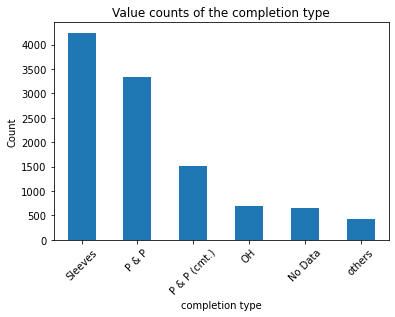

In [32]:
# bar plot again
df["ComplType_new"].value_counts().plot(kind="bar")
plt.title("Value counts of the completion type")
plt.xlabel("completion type")
plt.xticks(rotation=45)
plt.ylabel("Count")
plt.show()

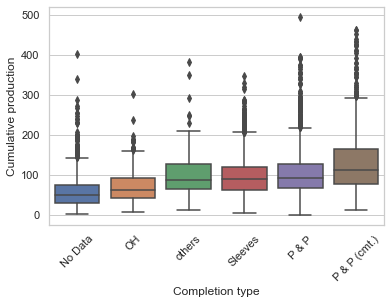

In [33]:
sns.set(style="whitegrid")
 
# Find the order
my_order = df.groupby(by=["ComplType_new"])["12 month Cum Prod"].median().sort_values().index

# Give it to the boxplot
sns.boxplot(x = 'ComplType_new',
            y = '12 month Cum Prod',
            data = df,
            order = my_order)
plt.xticks(rotation = 45)
plt.xlabel("Completion type")
plt.ylabel("Cumulative production")
plt.show()

## Creating new variable "Stage Length" = LL/Stages

In [67]:
## Creating new variable "Stage Length" = LL/Stages

df['stage_length'] = df['Lateral Length']/df['Stages']

## Heatmap

Text(0.5, 1.0, 'Spearman')

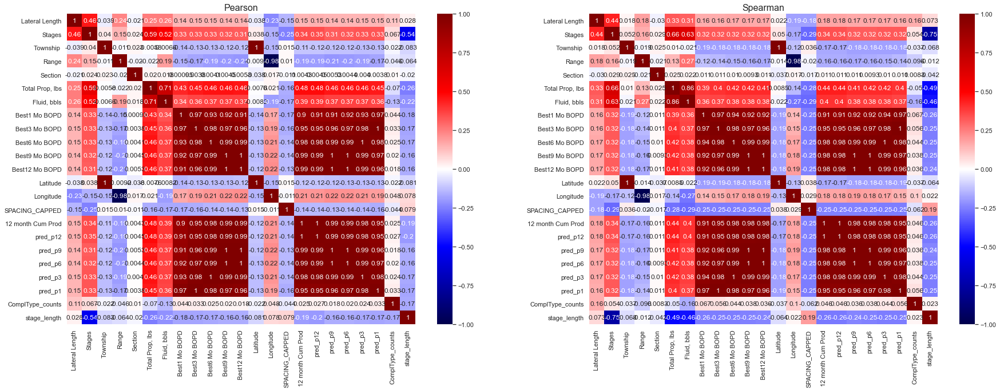

In [68]:
plt.figure(figsize= (30,10))
plt.subplot(121)
pearson = df.corr(method='pearson')
sns.heatmap(pearson, xticklabels=pearson.columns, yticklabels=pearson.columns,center=0, vmin=-1, vmax=1, cmap='seismic', annot=True)
plt.title("Pearson", fontsize=16)
plt.subplot(122)
spearman = df.corr(method='spearman')
sns.heatmap(spearman, xticklabels=spearman.columns, yticklabels=spearman.columns,center=0, vmin=-1, vmax=1, cmap='seismic', annot=True)
plt.title("Spearman", fontsize=16)

scatter plot between frac design and response variables

frac design = total prop/fluids * 42

remove parameters that are a function of one another
want to avoid multicollinearity 

want final list of predicatble variables
-->only categorical is compl type (remove township, can keep formation if you want)


among continuous variables, do a pairs plot to ensure that there is no multicollinearity

imputing 

1 vs 3, 1 vs 6, 1 vs 9, 1 vs 12, 1 vs cum

calculate standard deviations of each month -->calculate pairwise correlation:
s1, s3, s6...
r13, r1


# Mapping Production

In [69]:
import plotly.express as px
fig = px.scatter_geo(df,lat='Latitude',lon='Longitude', color="12 month Cum Prod") #or, you can drop the rows with na
 #This gives you an interactive map. Zoom in on the location and you can download the current view as a png figure.

fig.update_layout(title = 'Well locations', title_x=0.5)
fig.show()

In [77]:
df200 = df
df200['12 month Cum Prod'].value_counts

<bound method IndexOpsMixin.value_counts of 34       231.83
35       227.93
36       247.08
45       217.32
47       227.87
          ...  
9857     212.46
9898     201.41
10019    213.02
10479    212.87
10853    202.44
Name: 12 month Cum Prod, Length: 514, dtype: float64>

In [78]:
df200.drop(df200[df200['12 month Cum Prod'] <= 199].index, inplace = True)
df200['12 month Cum Prod'].value_counts

<bound method IndexOpsMixin.value_counts of 34       231.83
35       227.93
36       247.08
45       217.32
47       227.87
          ...  
9857     212.46
9898     201.41
10019    213.02
10479    212.87
10853    202.44
Name: 12 month Cum Prod, Length: 514, dtype: float64>

In [79]:
fig2 = px.scatter_geo(df200,lat='Latitude',lon='Longitude', color="12 month Cum Prod") #or, you can drop the rows with na
 #This gives you an interactive map. Zoom in on the location and you can download the current view as a png figure.

fig.update_layout(title = 'Well locations with >= 200 12 month cum', title_x=0.5)
fig.show()

In [ ]:
df50 = df
df50['12 month Cum Prod'].value_counts

In [ ]:
df50.drop(df50[df50['12 month Cum Prod'] >= 51].index, inplace = True)
df50['12 month Cum Prod'].value_counts

 ## Kruskal Wallis test

In [34]:
cum_prod_OH = df[( df["ComplType_new"] == "OH")]["12 month Cum Prod"]
cum_prod_NoData = df[( df["ComplType_new"] == "No Data")]["12 month Cum Prod"]
cum_prod_others = df[( df["ComplType_new"] == "others")]["12 month Cum Prod"]
cum_prod_Sleeves = df[( df["ComplType_new"] == "Sleeves")]["12 month Cum Prod"]
cum_prod_PP = df[( df["ComplType_new"] == "P & P")]["12 month Cum Prod"]
cum_prod_PPcmt = df[( df["ComplType_new"] == "P & P (cmt.)")]["12 month Cum Prod"]

stats.kruskal(cum_prod_OH,
              cum_prod_NoData,
              cum_prod_others,
             cum_prod_Sleeves,
             cum_prod_PP,
             cum_prod_PPcmt)

KruskalResult(statistic=1009.8730072680648, pvalue=4.378962429294685e-216)

Since the p-value is small there is significantly difference between completion type groups. 

## One Way Anova test

In [35]:
stats.f_oneway(cum_prod_OH,
              cum_prod_NoData,
              cum_prod_others,
             cum_prod_Sleeves,
             cum_prod_PP,
             cum_prod_PPcmt)

F_onewayResult(statistic=208.92733643827995, pvalue=2.0938843992566383e-213)

Since the p-value is small there is significantly difference between completion type groups.

# Formation

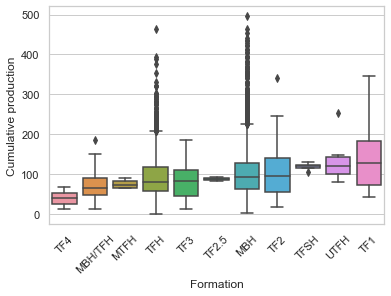

In [36]:
sns.set(style="whitegrid")
 
# Find the order
my_order = df.groupby(by=["Formation"])["12 month Cum Prod"].median().sort_values().index

# Give it to the boxplot
sns.boxplot(x = 'Formation',
            y = '12 month Cum Prod',
            data = df,
            order = my_order)
plt.xticks(rotation = 45)
plt.xlabel("Formation")
plt.ylabel("Cumulative production")
plt.show()

 ## Kruskal Wallis test

In [37]:
cum_prod_MBH = df[( df["Formation"] == "MBH")]["12 month Cum Prod"]
cum_prod_TFH = df[( df["Formation"] == "TFH")]["12 month Cum Prod"]
cum_prod_TF2 = df[( df["Formation"] == "TF2")]["12 month Cum Prod"]
cum_prod_TF3 = df[( df["Formation"] == "TF3")]["12 month Cum Prod"]
cum_prod_TF1 = df[( df["Formation"] == "TF1")]["12 month Cum Prod"]
cum_prod_MTFH = df[( df["Formation"] == "MTFH")]["12 month Cum Prod"]
cum_prod_UTFH = df[( df["Formation"] == "UTFH")]["12 month Cum Prod"]
cum_prod_TFSH = df[( df["Formation"] == "TFSH")]["12 month Cum Prod"]
cum_prod_TF4 = df[( df["Formation"] == "TF4")]["12 month Cum Prod"]
cum_prod_TF2_5 = df[( df["Formation"] == "TF2.5")]["12 month Cum Prod"]
cum_prod_MBHTFH = df[( df["Formation"] == "MBH/TFH")]["12 month Cum Prod"]


stats.kruskal(cum_prod_MBH,
              cum_prod_TFH,
              cum_prod_TF2,
              cum_prod_TF3,
              cum_prod_TF1,
              cum_prod_MTFH,
             cum_prod_UTFH,
             cum_prod_TFSH,
             cum_prod_TF4,
             cum_prod_TF2_5,
             cum_prod_MBHTFH)

KruskalResult(statistic=133.4052123040052, pvalue=9.423581974144481e-24)

Since the p-value is small there is significantly difference between Formation groups.

### One Way Anova

In [41]:
stats.f_oneway(cum_prod_MBH,
              cum_prod_TFH,
              cum_prod_TF2,
              cum_prod_TF3,
              cum_prod_TF1,
              cum_prod_MTFH,
             cum_prod_UTFH,
             cum_prod_TFSH,
             cum_prod_TF4,
             cum_prod_TF2_5,
             cum_prod_MBHTFH)

F_onewayResult(statistic=12.848641447201611, pvalue=1.3258871070206182e-22)

Since the p-value is small there is significantly difference between Formation groups.

## logistic regresion

In [42]:
x = df["12 month Cum Prod"]
y = df.ComplType_new
# splitting Data

x_train, x_test, y_train, y_test = train_test_split(x,
                 y,
                 test_size = .25,
                random_state = 483)
x_train = x_train.values.reshape(-1, 1)
x_test = x_test.values.reshape(-1, 1)

In [43]:
# instantiate the model (using the default parameters)
model_logreg = LogisticRegression(random_state = 483)

# fit the model with data
model_logreg.fit(x_train, y_train)    
y_pred = model_logreg.predict(x_test)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [44]:
def scatterGeoWells(color):
    import plotly.express as px
    fig = px.scatter_geo(df,
                       lat='Latitude',
                       lon='Longitude',
                       color=color)
    
    fig.update_layout(title = 'Well locations' + " (" + color + ")",
                    title_x=0.5,
                    geo = dict(scope = "usa"))
    
    fig.update_geos(fitbounds="locations",
                  visible=True)
    return fig

## 12 month cumulative production 

In [45]:
scatterGeoWells("12 month Cum Prod").show()

## compare production in different time interval

In [46]:
def plotMapWells(c):
    fig = df.plot(kind="scatter",
              x="Longitude",
              y="Latitude",
              figsize=(10,7),
              label= c,
              c=c,
              cmap=plt.get_cmap("jet"),
              colorbar=True,
              alpha=0.4)

    plt.ylabel("Latitude", fontsize=14)
    plt.xlabel("Longitude", fontsize=14)
    plt.legend(fontsize=16)
    plt.show()

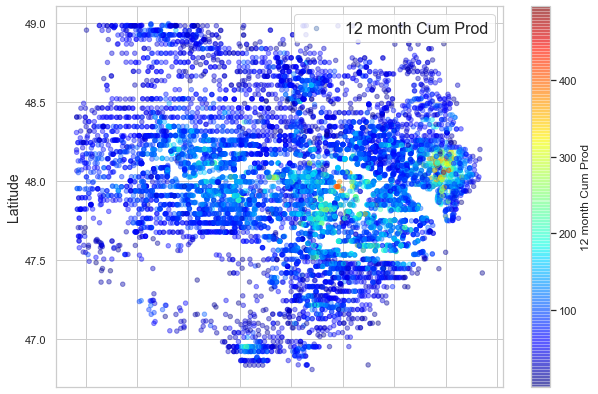

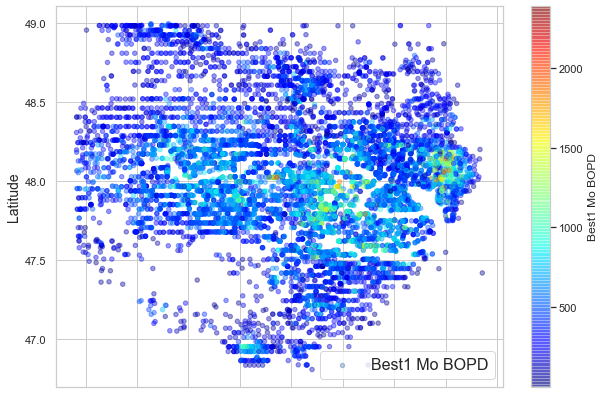

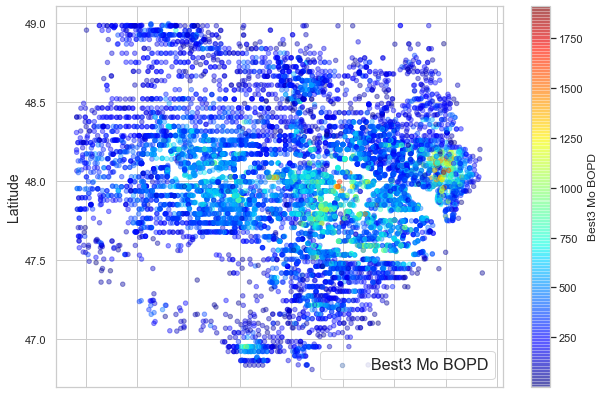

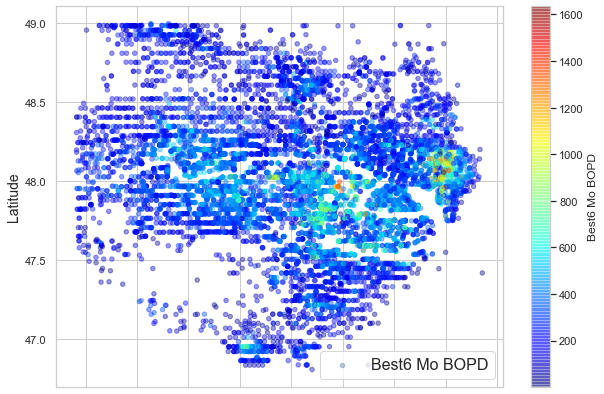

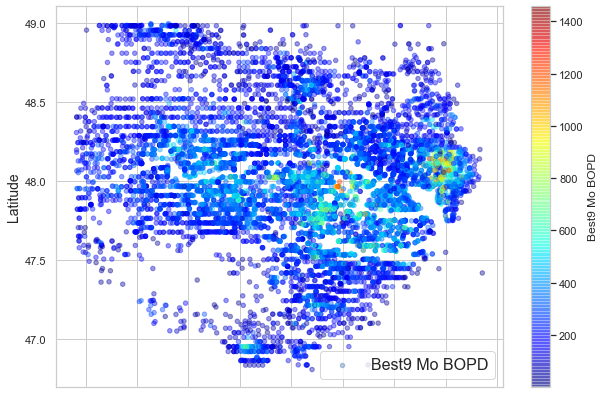

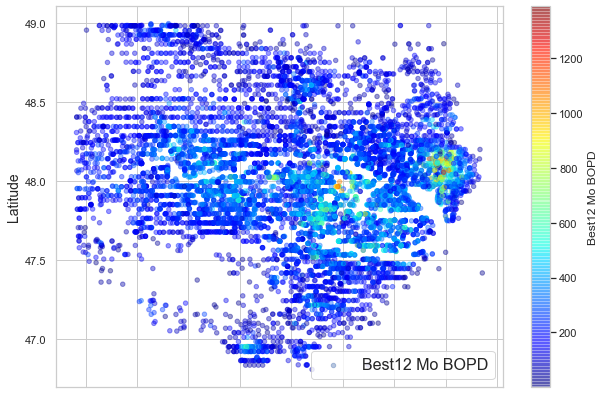

In [47]:
plotMapWells("12 month Cum Prod")
plotMapWells("Best1 Mo BOPD")
plotMapWells("Best3 Mo BOPD")
plotMapWells("Best6 Mo BOPD")
plotMapWells("Best9 Mo BOPD")
plotMapWells("Best12 Mo BOPD")

## Apply Decission Tree to predict the cumulative production base on location

In [48]:
y = df["12 month Cum Prod"]
x = df[["Latitude", "Longitude"]]
# splitting Data

x_train, x_test, y_train, y_test = train_test_split(x,
                 y,
                 test_size = .25,
                random_state = 483)
#x_train = x_train.values.reshape(-1, 1)
#x_test = x_test.values.reshape(-1, 1)

In [49]:

model = DecisionTreeRegressor(random_state=483)
model.fit(x_train, y_train)
pred = model.predict(x_test)

## Performance of the model (Root Square Mean Error)

In [50]:

rmse = np.sqrt(mean_squared_error(y_test, pred))
rmse

49.12587865259847

## Plot random location with predicted cumulative production

In [51]:
max_lat = df["Latitude"].max()
min_lat = df["Latitude"].min()
max_lon = df["Longitude"].max()
min_lon = df["Longitude"].min()

In [52]:
randon_location = {"Latitude": [],
                  "Longitude": []}
lat = np.linspace(min_lat, max_lat,  100)
lon = np.linspace(min_lon, max_lon,  100)

for i in lat:
    for j in lon:
        randon_location["Latitude"].append(i)
        randon_location["Longitude"].append(j)

In [53]:
randon_location = pd.DataFrame(randon_location)
pred_prod = model.predict(randon_location)

In [54]:
randon_location["12 month Cum Prod"] = pred_prod

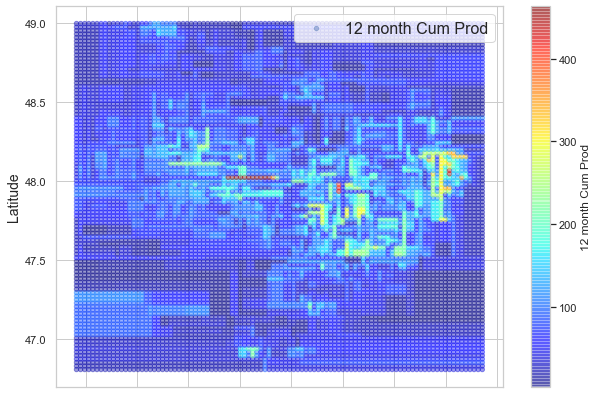

In [55]:
fig = randon_location.plot(kind="scatter",
              x="Longitude",
              y="Latitude",
              figsize=(10,7),
              label= "12 month Cum Prod",
              c="12 month Cum Prod",
              cmap=plt.get_cmap("jet"),
              colorbar=True,
              alpha=0.4)

plt.ylabel("Latitude", fontsize=14)
plt.xlabel("Longitude", fontsize=14)
plt.legend(fontsize=16)
plt.show()

## Compare with True plot cumulative production

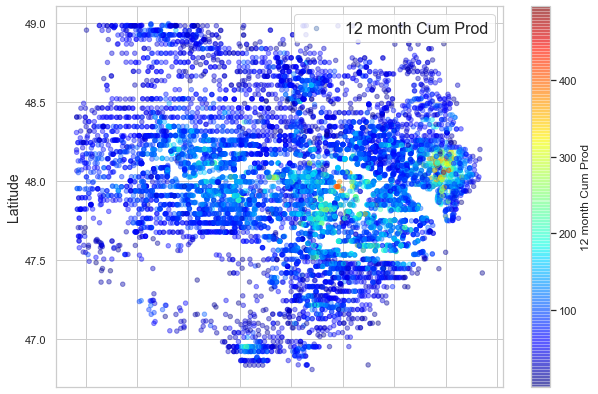

In [56]:
plotMapWells("12 month Cum Prod")

# Below we are performing a group-by analysis; first is Township, similar syntax can be used for frac and compl. design as well.

# Township

### Check for na 

In [57]:
print( "There is ", df["Township "].isnull().sum(), " NA value.")

There is  0  NA value.


In [58]:
df["Township "].unique()

array([143, 160, 142, 152, 156, 141, 147, 146, 144, 148, 145, 149, 153,
       151, 150, 155, 139, 154, 159, 161, 164, 157, 158, 140, 162, 163],
      dtype=int64)

In [59]:
df.groupby(by=["Township "])["12 month Cum Prod"].mean().nlargest(5)

Township 
152    125.443363
150    124.001244
153    119.567673
151    115.265792
147    114.016368
Name: 12 month Cum Prod, dtype: float64

In [60]:
df.groupby(by=["Township "])["Best1 Mo BOPD"].mean().nlargest(5)

Township 
152    677.900602
150    659.135922
151    608.975349
147    605.028789
153    603.951052
Name: Best1 Mo BOPD, dtype: float64

In [61]:
df.groupby(by=["Township "])["Best3 Mo BOPD"].mean().nlargest(5)

Township 
152    544.357210
150    534.044304
151    494.018560
153    490.288805
147    479.949200
Name: Best3 Mo BOPD, dtype: float64

In [62]:
df.groupby(by=["Township "])["Best6 Mo BOPD"].mean().nlargest(5)

Township 
152    442.714595
150    437.954618
153    408.110869
151    405.545798
147    395.336410
Name: Best6 Mo BOPD, dtype: float64

In [63]:
df.groupby(by=["Township "])["Best9 Mo BOPD"].mean().nlargest(5)

Township 
152    380.264904
150    375.213087
153    358.747491
151    349.978929
147    341.685648
Name: Best9 Mo BOPD, dtype: float64

In [64]:
df.groupby(by=["Township "])["Best12 Mo BOPD"].mean().nlargest(5)

Township 
152    337.692235
150    333.114862
153    321.253605
151    311.075737
147    305.412036
Name: Best12 Mo BOPD, dtype: float64

In [65]:
df.groupby(by=["Township "])["Best12 Mo BOPD"].mean().nlargest(5)

Township 
152    337.692235
150    333.114862
153    321.253605
151    311.075737
147    305.412036
Name: Best12 Mo BOPD, dtype: float64

152, 150, 153, 151, 147 are the highest Township categories.

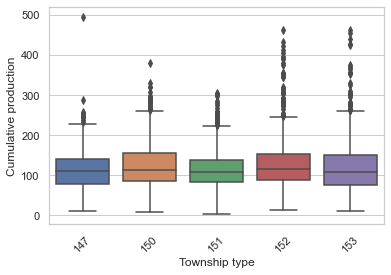

In [66]:
sns.set(style="whitegrid")
 
# Find the order
list_top5_township = [152, 150, 153, 151, 147]
df_top5_township = df[df["Township "].isin(list_top5_township)]
# Give it to the boxplot
sns.boxplot(x = 'Township ',
            y = '12 month Cum Prod',
            data = df_top5_township)

plt.xticks(rotation = 45)
plt.xlabel("Township type")
plt.ylabel("Cumulative production")
plt.show()

# Random Forest

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV 

In [85]:
df.head()

,Operator,Well Name,Formation,Lateral Length,Stages,Township,Range,Section,"Total Prop, lbs","Fluid, bbls",...,12 month Cum Prod,pred_p12,pred_p9,pred_p6,pred_p3,pred_p1,ComplType_counts,ComplType_new,stage_length,frac_design
34,Operator 12,Well 3980,TFH,8851.0,44.0,150,94,20,8889960.0,106544.000000,...,231.83,602.486653,657.759656,789.506478,984.681442,1226.896464,1503.0,P & P (cmt.),201.159091,1.986651
35,Operator 12,Well 3984,TFH,9572.0,47.0,150,94,20,9577580.0,114748.000000,...,227.93,592.769802,615.242634,701.155046,851.472466,1096.391872,1503.0,P & P (cmt.),203.659574,1.987291
36,Operator 12,Well 3993,TFH,9041.0,45.0,150,94,17,9046920.0,106883.000000,...,247.08,640.417789,719.976635,859.567590,1084.581088,1328.483576,1503.0,P & P (cmt.),200.911111,2.015314
45,Operator 32,Well 4556,TFH,10590.0,30.0,152,96,3,3499020.0,55731.166667,...,217.32,566.299567,654.442821,791.635123,1009.711318,1360.068369,4244.0,Sleeves,353.000000,1.494855
47,Operator 32,Well 4570,MBH,10594.0,30.0,152,96,3,3318860.0,53292.714286,...,227.87,592.620258,708.809832,847.615438,1081.208706,1414.542879,4244.0,Sleeves,353.133333,1.482763


In [93]:
targets2 = df['12 month Cum Prod']
features2 = df[['Township ', 'Range', 'Section', 'Best1 Mo BOPD','Best6 Mo BOPD','Latitude','Longitude', 'stage_length','frac_design']]

In [94]:
from sklearn.model_selection import KFold  ### import

cv1 = KFold(n_splits=3, shuffle = True, random_state=125) # instance

In [95]:
from sklearn.model_selection import train_test_split
X_train2, X_test2, y_train2, y_test2 = train_test_split(features2, targets2, test_size = 0.30)

In [96]:
from sklearn.preprocessing import StandardScaler
scl = StandardScaler().fit(X_train2) 
X_train2 = scl.transform(X_train2) 
X_test2 = scl.transform(X_test2)

ValueError: Input contains infinity or a value too large for dtype('float64').

In [92]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
%%time
clf = RandomForestRegressor(n_estimators = 100)

from sklearn.model_selection import GridSearchCV 
# perform hyperparameter optimization for the Regression Forest Regressor
param_grid1 = {'min_samples_leaf': [1, 5], 'max_depth':[4,6,8], 'max_features':[2,3,4], 'n_estimators':[50,150, 300]} # dictionary with keys
grid_rf = GridSearchCV(clf, param_grid=param_grid1, cv=cv1, verbose=3)  # estimator
grid_rf.fit(X_train, y_train) 
print (grid_rf.best_score_, grid_rf.best_params_) 